Due to the growing concern about COVID-19, this week I made a text composition using font data to visualize the number of cases in NYC, by referencing Allison's [Manipulating font data](https://github.com/aparrish/material-of-language/blob/master/manipulating-font-data.ipynb). And I chose a font called [ZCOOL XiaoWei](https://fonts.google.com/specimen/ZCOOL+XiaoWei).

In [2]:
from flat import document, rgb, rgba, font, strike, shape
from flat.command import moveto, quadto, curveto, lineto, closepath
from bezmerizing import Polyline, Path
import numpy as np
from copy import copy

In [3]:
from numpy.random import uniform, normal, choice

In [4]:
from IPython.display import SVG, display
def show(page):
    display(SVG(page.svg()))

In [7]:
def glyphcommands(f, ch):
    return Path([copy(cmd) for cmd in f.glyph(f.charmap[ord(ch)])])
def advancefor(f, ch):
    return f.advances[f.charmap[ord(ch)]]

First, load the font and the helper functions.

In [33]:
f = font.open("./ZCOOLXiaoWei-Regular.ttf")

In [34]:
s = "这是什么猫"

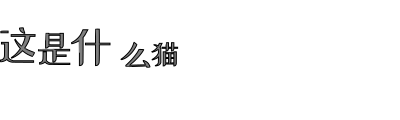

In [36]:
page = document(300, 90, 'pt').addpage()
pen = shape().stroke(rgba(0, 0, 0, 255)).fill(rgba(0, 0, 0, 128))
factor = 36 / f.density
cx = 0
for ch in s:
    glyph_path = (glyphcommands(f, ch)
                  .scale(factor * uniform(0.75, 1.5))
                  .translate(cx + normal(0, 4), 60 + normal(0, 4)))
    page.place(pen.path(glyph_path))
    cx += advancefor(f, ch) * factor
show(page)

In [37]:
from itertools import chain
def combine_path(f, s):
    text_paths = []
    cx = 0
    for ch in s:
        glyph_path = glyphcommands(f, ch).translate(cx, 0)
        text_paths.append(glyph_path)
        cx += advancefor(f, ch)
    combined = Path(list(chain(*text_paths)))
    return combined

In [11]:
def nudge(cmd, x, y):
    c = copy(cmd)
    if type(cmd) in (moveto, lineto, quadto, curveto):
        c.x += x
        c.y += y
    if type(cmd) in (quadto, curveto):
        c.x1 += x
        c.y1 += y
    if type(cmd) == curveto:
        c.x2 += x
        c.y2 += y
    return c

In [12]:
def stretch_char(f, ch, height=-0.33):
    path_orig = glyphcommands(f, ch)
    path_cmds = []
    mid_y = f.ascender * height
    for cmd in path_orig:
        if hasattr(cmd, 'y') and cmd.y < mid_y:
            path_cmds.append(nudge(cmd, x=0, y=-200))
        else:
            path_cmds.append(cmd)
    path_mod = Path(path_cmds)
    return path_mod

To visualize the number of cases via text, I decided to make an NYC map that is filled with the word "New York" (and "纽约" in Chinese) and deform the font of the text according to their zipcode location based on the number of cases.

I tried a few ways to deform the font by directly messing with the Xs and/or Ys of the paths. Yet, I found that the style of a font is so dependent on the relative relationships between its Xs and Ys, that if I shift the Xs and Ys individually by random (or other distribution), the font simply looks messy and its style is gone.

I wondered, what would be the appropriate way to break the font while still being able to keep its inherent structure. Then I realized that the "closepath" command can be used as a natural indicator for where to break apart a charater. Each path can be treated as a relatively stable component, and by displacing the relative locations of each path within a charater, I can get the feeling of a font that is "broken" but still recoginizable. 

In [17]:
def displace_each_closedpaths(ch, x_scale, y_scale):
    path_orig = glyphcommands(f, ch)
    path_cmds = []
    path_x_off = normal(0, x_scale)
    path_y_off = normal(0, y_scale)
    for cmd in path_orig:
        if hasattr(cmd, 'x') and hasattr(cmd, 'y'):
            path_cmds.append(nudge(cmd, x=path_x_off, y=path_y_off))
        else:
            path_x_off = normal(0, x_scale)
            path_y_off = normal(0, y_scale)
    path_mod = Path(path_cmds)
    return path_mod

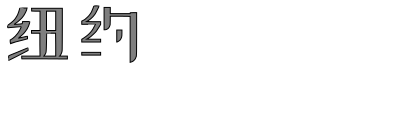

In [43]:
page = document(300, 90, 'pt').addpage()
pen = shape().stroke(rgba(0, 0, 0, 255)).fill(rgba(0, 0, 0, 128))
factor = 72 / f.density
cx = 0
for ch in "纽约":
    glyph_path = (glyphcommands(f, ch)
                  .scale(factor)
                  .translate(cx + normal(0, 4), 60))
    page.place(pen.path(glyph_path))
    cx += advancefor(f, ch) * factor
show(page)

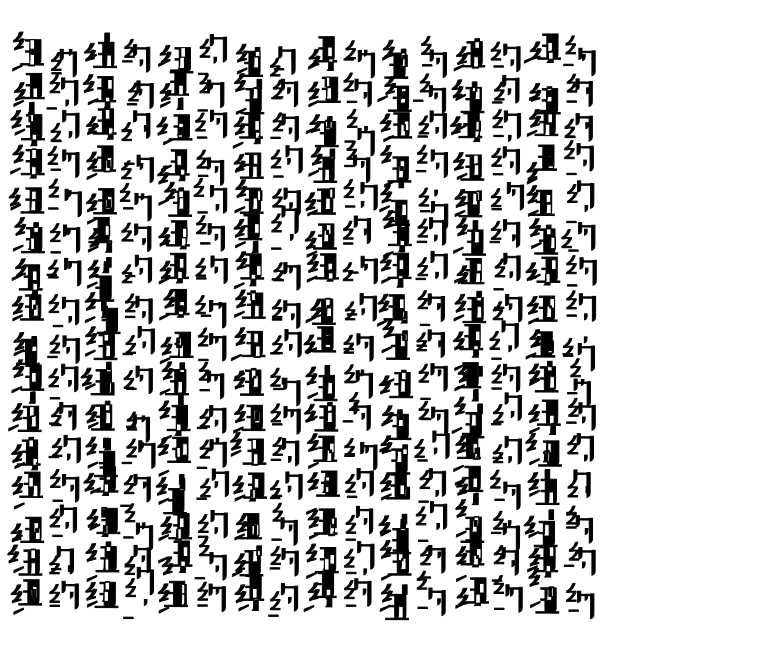

In [44]:
size = 36

width = 576 # 5in
height = 500 # 4in
border = 9 # 1/8in
lineheight = size # size of each line

page = document(width, height, 'pt').addpage()
pen = shape().stroke(rgba(0, 0, 0, 255)).fill(rgba(0, 0, 0, 255))
factor = size / f.density

xoff = border
yoff = border

cx = 0
cy = 0

for line in open("displace.txt", encoding="utf-8"):
    line = line.strip() # remove trailing whitespace
    for ch in line:
        glyph_path = (displace_each_closedpaths(ch, 50, 150)
                  .scale(factor)
                  .translate(xoff, 60 + yoff))
        page.place(pen.path(glyph_path))
        xoff += advancefor(f, ch) * factor
        cx += 1
    xoff = border
    yoff += lineheight
    cx = 0
    cy += 1
    
show(page)

Then I can make a deformed circle of text in the composition by calculating the distance bewteen the center of deformation and the cx and cy of each character.

In [18]:
def get_scale_by_center(cx, cy, center_x, center_y, max_dist, base_scale):
    dist = sqrt(pow(cx - center_x, 2) + pow(cy - center_y, 2))
    scale = np.interp(dist,[0,max_dist],[0,base_scale])
    return scale

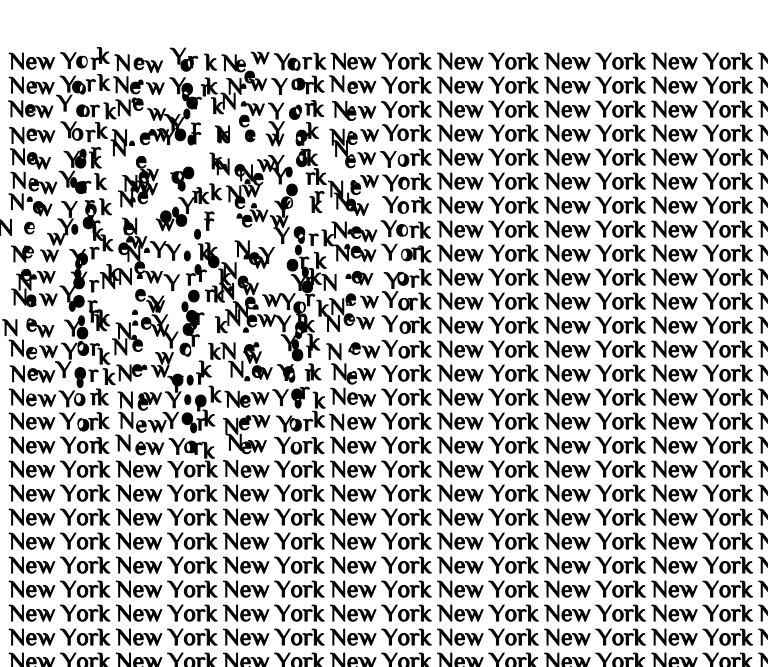

In [46]:
size_pt = 24

width = 576 # 5in
height = 500 # 4in
border = 9 # 1/8in
lineheight = size_pt # size of each line

page = document(width, height, 'pt').addpage()
pen = shape().stroke(rgba(0, 0, 0, 255)).fill(rgba(0, 0, 0, 255))
factor = size_pt / f.density

xoff = border
yoff = border

cx = 0
cy = 0

center_x = 15
center_y = 15

for line in open("displace_ny.txt", encoding="utf-8"):
    line = line.strip() # remove trailing whitespace
    for ch in line:
        displace_scale = 500 - get_scale_by_center(cx, cy * 2, center_x, center_y, 20, 500)
        glyph_path = (displace_each_closedpaths(ch, displace_scale, displace_scale)
                  .scale(factor)
                  .translate(xoff, 60 + yoff))
        page.place(pen.path(glyph_path))
        xoff += advancefor(f, ch) * factor
        cx += 1
    xoff = border
    yoff += lineheight
    cx = 0
    cy += 1
    
show(page)

And also create the feeling of "gone" by taking some characters away.

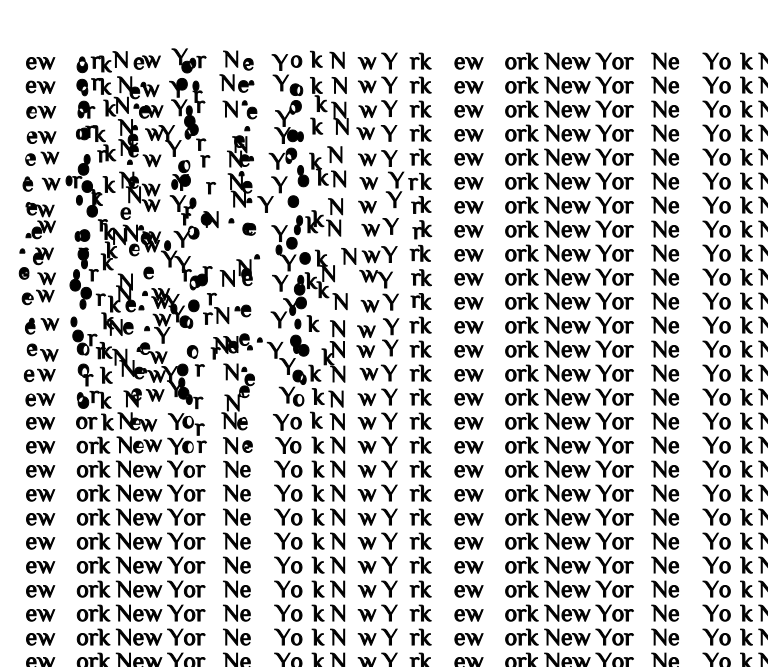

In [47]:
size_pt = 24

width = 576 # 5in
height = 500 # 4in
border = 9 # 1/8in
lineheight = size_pt # size of each line

page = document(width, height, 'pt').addpage()
pen = shape().stroke(rgba(0, 0, 0, 255)).fill(rgba(0, 0, 0, 255))
factor = size_pt / f.density

xoff = border
yoff = border

cx = 0
cy = 0

center_x = 15
center_y = 15

for line in open("displace_ny.txt", encoding="utf-8"):
    line = line.strip() # remove trailing whitespace
    for ch in line:
        displace_scale = 500 - get_scale_by_center(cx, cy * 2, center_x, center_y, 20, 500)
        glyph_path = (displace_each_closedpaths(ch, displace_scale, displace_scale)
                  .scale(factor)
                  .translate(xoff, 60 + yoff))
        if (cx + cy * len(line)) % 4 != 0:
            page.place(pen.path(glyph_path))
        xoff += advancefor(f, ch) * factor
        cx += 1
    xoff = border
    yoff += lineheight
    cx = 0
    cy += 1
    
show(page)

Now it's time to create the text map. I made a graysclae image based on the case count by zip code map from [NYC.gov](https://www1.nyc.gov/assets/doh/downloads/pdf/imm/covid-19-cases-by-zip-04072020-1.pdf), and down-sampled it to 100px * 100 px so that each pixel can be mapped to an indicidual character. The mapping logic is that the darker the pixel, the more cases in that area, and the greater the amount of deformation I will apply onto that character.

In [19]:
from PIL import Image

In [20]:
width = 128
height = 128
img_to_load = '100.png'

In [21]:
im = Image.open(img_to_load)
im_bw = im.convert('L')
px = im_bw.load()
print(px[80,30])

85


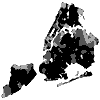

In [984]:
im_bw

In [22]:
def map_px_to_4_scale(px_value, max_scale_value):
    switcher = {
                255: -1,
                170: max_scale_value / 5 * 0,
                85: max_scale_value / 5 * 1,
                0: max_scale_value / 5 * 5
                }
    return switcher.get(px_value)

And here's the final result using "New York" or "纽约" as the underlying text.

In [23]:
size_pt = 24

width = 3500 # 5in
height = 2400 # 4in
border = 9 # 1/8in
lineheight = size_pt - 2 # size of each line

page = document(width, height, 'pt').addpage()
pen = shape().stroke(rgba(0, 0, 0, 255)).fill(rgba(0, 0, 0, 255))
factor = size_pt / f.density

xoff = border
yoff = border

cx = 0
cy = 0


for line in open("text.txt", encoding="utf-8"):
    line = line.strip() # remove trailing whitespace
    for ch in line:
#         print(cx, cy)
        displace_scale = map_px_to_4_scale(px[cx, cy], 200)
#         print(displace_scale)
        if displace_scale != -1:
            glyph_path = (displace_each_closedpaths(ch, displace_scale, displace_scale)
                          .scale(factor)
                          .translate(xoff, 60 + yoff))
            page.place(pen.path(glyph_path))

        xoff += advancefor(f, ch) * factor
        cx += 1
    xoff = border
    yoff += lineheight
    cx = 0
    cy += 1
    
show(page)

In [32]:
size_pt = 24

width = 3500 # 5in
height = 2400 # 4in
border = 9 # 1/8in
lineheight = size_pt - 2 # size of each line

page = document(width, height, 'pt').addpage()
pen = shape().stroke(rgba(0, 0, 0, 255)).fill(rgba(0, 0, 0, 255))
factor = size_pt / f.density

xoff = border
yoff = border

cx = 0
cy = 0


for line in open("text2.txt", encoding="utf-8"):
    line = line.strip() # remove trailing whitespace
    for ch in line:
#         print(cx, cy)
        displace_scale = map_px_to_4_scale(px[cx, cy], 200)
#         print(displace_scale)
        if displace_scale != -1:
            glyph_path = (displace_each_closedpaths(ch, displace_scale, displace_scale)
                          .scale(factor)
                          .translate(xoff, 60 + yoff))
            page.place(pen.path(glyph_path))

        xoff += advancefor(f, ch) * factor
        cx += 1
    xoff = border
    yoff += lineheight
    cx = 0
    cy += 1
    
show(page)